In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [10]:
def events_to_voxel_grid(events, num_bins=1, width=346, height=260):
    """
    Build a voxel grid with bilinear interpolation in the time domain from a set of events.
    :param events: a [N x 4] NumPy array containing one event per row in the form: [timestamp, x, y, polarity]
    :param num_bins: number of bins in the temporal axis of the voxel grid
    :param width, height: dimensions of the voxel grid
    """

    assert(events.shape[1] == 4)
    assert(num_bins > 0)
    assert(width > 0)
    assert(height > 0)

    voxel_grid = np.zeros((num_bins, height, width), np.float32).ravel()

    # normalize the event timestamps so that they lie between 0 and num_bins
    last_stamp = events[-1, 0]
    first_stamp = events[0, 0]
    deltaT = last_stamp - first_stamp

    if deltaT == 0:
        deltaT = 1.0

    events[:, 0] = (num_bins - 1) * (events[:, 0] - first_stamp) / deltaT
    ts = events[:, 0]
    xs = events[:, 1].astype(np.int)
    ys = events[:, 2].astype(np.int)
    pols = events[:, 3]
    pols[pols == 0] = -1  # polarity should be +1 / -1

    tis = ts.astype(np.int)
    dts = ts - tis
    vals_left = pols * (1.0 - dts)
    vals_right = pols * dts

    valid_indices = tis < num_bins
    np.add.at(voxel_grid, xs[valid_indices] + ys[valid_indices] * width +
              tis[valid_indices] * width * height, vals_left[valid_indices])

    valid_indices = (tis + 1) < num_bins
    np.add.at(voxel_grid, xs[valid_indices] + ys[valid_indices] * width +
              (tis[valid_indices] + 1) * width * height, vals_right[valid_indices])

    voxel_grid = np.reshape(voxel_grid, (num_bins, height, width))

    return voxel_grid

def make_voxel_grid(events, times, width=346, height=260):
    voxel_grid = np.zeros((len(times), height, width), np.float32)

    for idx, time in enumerate(times[:,1]):
        if idx == 0: indices = np.where(events[:, 0]<time)[0]
        else: indices = np.where((times[idx-1,1]<events[:, 0]) & (events[:, 0]<time))[0]

        voxel_grid[idx, :] = events_to_voxel_grid(events[indices,:])
        plt.imshow(voxel_grid[idx])
        plt.show()

    return 0

<ipython-input-10-e0ba8c9678c7>:26: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  xs = events[:, 1].astype(np.int)
<ipython-input-10-e0ba8c9678c7>:27: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for m

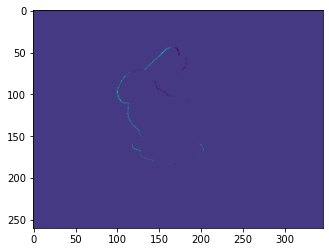

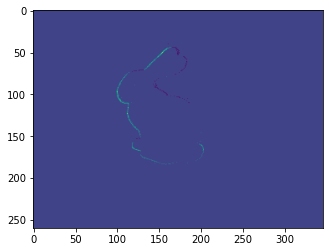

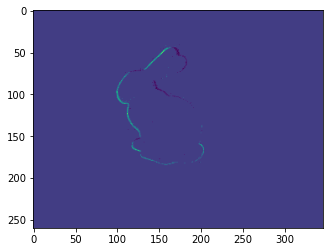

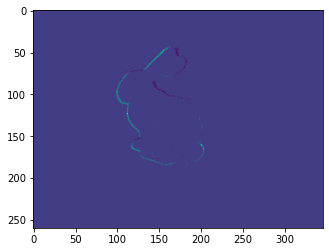

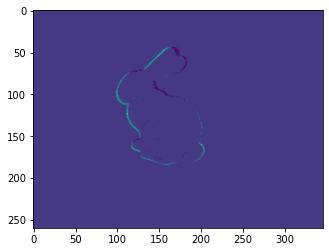

...

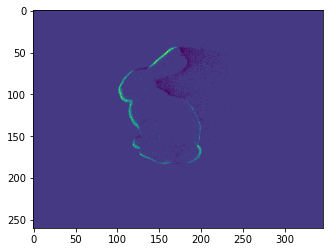

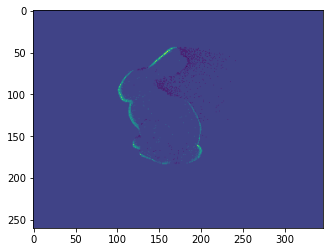

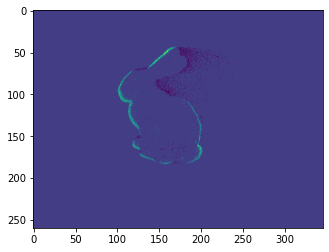

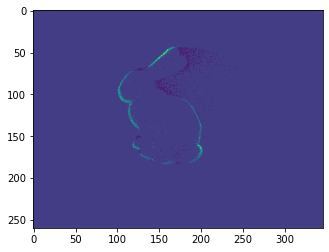

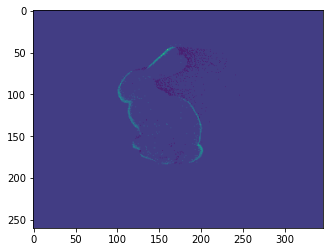

In [11]:
times = np.loadtxt("dvs-video-frame_times.txt")
events = np.loadtxt("v2e-dvs-events.txt")
voxel_grid = make_voxel_grid(events, times)

#for idx, voxel in enumerate(voxel_grid):
#    plt.imshow(voxel)
#    plt.savefig("./savefig/{}.png".format(idx))